In [748]:
pip install --upgrade scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
from datetime import date
import pandas_profiling
import plotly.express as px
from sklearn.metrics import classification_report
from sklearn.metrics import r2_score, mean_squared_error
from sklearn import svm
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
%matplotlib inline


## Lendo os dados ##

In [2]:
base_ifood = pd.read_csv("ml_project1_data.csv")
base_ifood

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,...,3,0,0,0,0,0,0,3,11,0


### Verificando os tipos dos dados e se há algum dado nulo ### 

In [3]:
base_ifood.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [4]:
base_ifood.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

### Tratando os dados vazios pela média e, posteriormente, verificando se deu certo ###

In [5]:
base_ifood['Income'].mean()

52247.25135379061

In [6]:
base_ifood['Income'].fillna(base_ifood['Income'].mean(), inplace=True)
base_ifood['Income']

0       58138.0
1       46344.0
2       71613.0
3       26646.0
4       58293.0
         ...   
2235    61223.0
2236    64014.0
2237    56981.0
2238    69245.0
2239    52869.0
Name: Income, Length: 2240, dtype: float64

### Convertendo a coluna Dt_customer ###

In [7]:
base_ifood['Dt_Customer']= pd.to_datetime(base_ifood['Dt_Customer'], format ='%Y-%m-%d')

In [8]:
base_ifood['Dt_Customer']

0      2012-09-04
1      2014-03-08
2      2013-08-21
3      2014-02-10
4      2014-01-19
          ...    
2235   2013-06-13
2236   2014-06-10
2237   2014-01-25
2238   2014-01-24
2239   2012-10-15
Name: Dt_Customer, Length: 2240, dtype: datetime64[ns]

In [9]:
base_ifood['Ano de consumo'] = base_ifood['Dt_Customer'].dt.year
base_ifood

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Ano de consumo
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,0,0,0,0,0,0,3,11,1,2012
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,0,0,0,0,0,0,3,11,0,2014
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,0,0,0,0,0,0,3,11,0,2013
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,...,0,0,0,0,0,0,3,11,0,2014
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,0,0,0,0,0,0,3,11,0,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,...,0,0,0,0,0,0,3,11,0,2013
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,...,0,0,0,1,0,0,3,11,0,2014
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,...,0,1,0,0,0,0,3,11,0,2014
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,...,0,0,0,0,0,0,3,11,0,2014


- Calculando a idade

In [10]:
base_ifood['Idade'] = 2021 - base_ifood['Year_Birth']
base_ifood

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Ano de consumo,Idade
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,0,0,0,0,0,3,11,1,2012,64
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,0,0,0,0,0,3,11,0,2014,67
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,0,0,0,0,0,3,11,0,2013,56
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,...,0,0,0,0,0,3,11,0,2014,37
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,0,0,0,0,0,3,11,0,2014,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,...,0,0,0,0,0,3,11,0,2013,54
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,...,0,0,1,0,0,3,11,0,2014,75
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,...,1,0,0,0,0,3,11,0,2014,40
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,...,0,0,0,0,0,3,11,0,2014,65


### Removendo as colunas que não iremos utilizar ###

In [11]:
d=['ID',"Dt_Customer", "Z_CostContact", 'Z_Revenue', 'Year_Birth']

In [12]:
base_ifood=base_ifood.drop(columns=d)
base_ifood

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Ano de consumo,Idade
0,Graduation,Single,58138.0,0,0,58,635,88,546,172,...,7,0,0,0,0,0,0,1,2012,64
1,Graduation,Single,46344.0,1,1,38,11,1,6,2,...,5,0,0,0,0,0,0,0,2014,67
2,Graduation,Together,71613.0,0,0,26,426,49,127,111,...,4,0,0,0,0,0,0,0,2013,56
3,Graduation,Together,26646.0,1,0,26,11,4,20,10,...,6,0,0,0,0,0,0,0,2014,37
4,PhD,Married,58293.0,1,0,94,173,43,118,46,...,5,0,0,0,0,0,0,0,2014,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,Graduation,Married,61223.0,0,1,46,709,43,182,42,...,5,0,0,0,0,0,0,0,2013,54
2236,PhD,Together,64014.0,2,1,56,406,0,30,0,...,7,0,0,0,1,0,0,0,2014,75
2237,Graduation,Divorced,56981.0,0,0,91,908,48,217,32,...,6,0,1,0,0,0,0,0,2014,40
2238,Master,Together,69245.0,0,1,8,428,30,214,80,...,3,0,0,0,0,0,0,0,2014,65


### Análise das correlações e dos outliers ###

<AxesSubplot:>

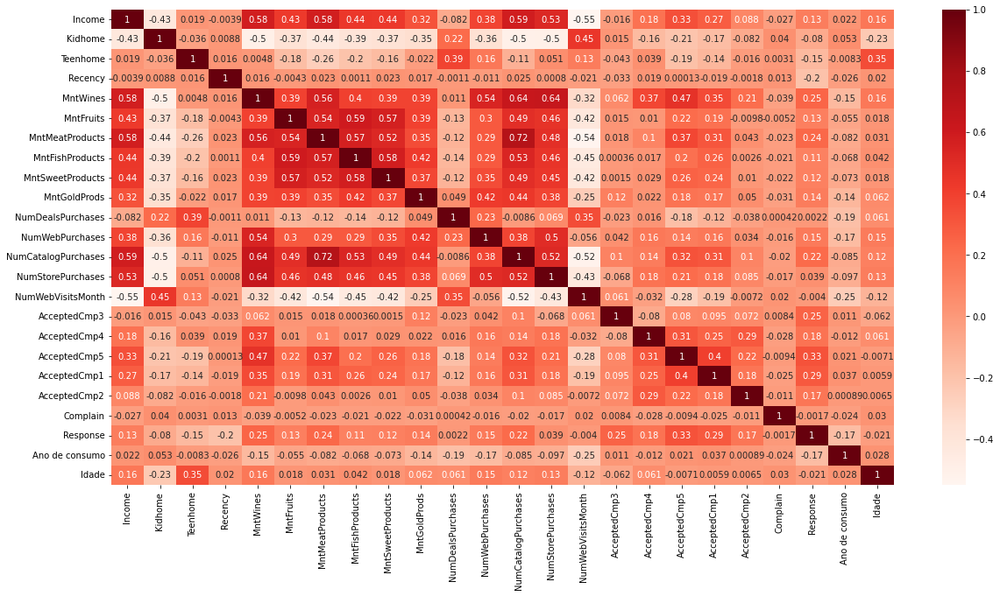

In [13]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,10))
sns.heatmap(base_ifood.corr(), annot=True, cmap = 'Reds')


## Análise do gráfico de correlação entre as variáveis ##

#### Quanto maior a intensidade do vermelhor maior a correlação, ou seja, se o valor estiver mais próximo do 1 mais as variáveis estão diretamente relacionadas. Dessa forma temos que: ####
- O número de compras feitas nos catálogos e nas lojas estão correlacionados com as quantidades de crianças;
- A quantidade de visitas no site da empresa (mês passado) está correlacionado com a renda familiar anual;
- A quantidade gasta em carne nos últimos 2 anos está correlacionado com a o número de compras usando o catálogo;

### Retirando as colunas que tiveram todas as variáveis (exceto ela mesma) com correlação negativa e/ou muito próximas a 0, ou seja, menor que 0.1 ###

In [14]:
d=['Complain', 'Ano de consumo']

In [15]:
data=base_ifood.drop(columns=d)
data

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Idade
0,Graduation,Single,58138.0,0,0,58,635,88,546,172,...,10,4,7,0,0,0,0,0,1,64
1,Graduation,Single,46344.0,1,1,38,11,1,6,2,...,1,2,5,0,0,0,0,0,0,67
2,Graduation,Together,71613.0,0,0,26,426,49,127,111,...,2,10,4,0,0,0,0,0,0,56
3,Graduation,Together,26646.0,1,0,26,11,4,20,10,...,0,4,6,0,0,0,0,0,0,37
4,PhD,Married,58293.0,1,0,94,173,43,118,46,...,3,6,5,0,0,0,0,0,0,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,Graduation,Married,61223.0,0,1,46,709,43,182,42,...,3,4,5,0,0,0,0,0,0,54
2236,PhD,Together,64014.0,2,1,56,406,0,30,0,...,2,5,7,0,0,0,1,0,0,75
2237,Graduation,Divorced,56981.0,0,0,91,908,48,217,32,...,3,13,6,0,1,0,0,0,0,40
2238,Master,Together,69245.0,0,1,8,428,30,214,80,...,5,10,3,0,0,0,0,0,0,65


### Análise Outliers ###

In [16]:
def limites(coluna):
    q1 = coluna.quantile(0.25)
    q3 = coluna.quantile(0.75)
    amplitude = q3 - q1
    return q1 - 1.5 * amplitude, q3 + 1.5 * amplitude

In [17]:
#print(limites(data['Idade']))
#data['Income'].describe()
#print(68289.750000 + 1.5 * (68289.750000 - 35538.750000))

In [18]:
def diagrama_caixa(coluna):
    fig, (ax1, ax2) = plt.subplots(1,2)
    sns.boxplot(x=coluna, ax=ax1)
    fig.set_size_inches(15,5)
    ax2.set_xlim(limites(coluna))
    sns.boxplot(x=coluna, ax=ax2)

In [19]:
def histograma(coluna):
    plt.figure(figsize=(15,5))
    sns.distplot(coluna,hist=True)

## Como estamos construindo um modelo de previsão para encontrar o perfil ideal de consumidor, quando existem poucos outliers (valores acima do limite superior), podemos excluí-los para não interferir no modelo de classificação e gerar, assim, um modelo com baixa acurácia. ##

In [20]:
def excluir_outliers(df, nome_coluna):
    qtde_linhas = df.shape[0]
    lim_inf, lim_sup = limites(df[nome_coluna])
    df = df.loc[(df[nome_coluna]>= lim_inf) & (df[nome_coluna] <= lim_sup),:]
    linhas_removidas = qtde_linhas - df.shape [0] 
    return df, linhas_removidas

### Removendo outliers do Income (renda familiar anual) ###

 - Gráfico Income com outlier

C:\Users\ferna.DESKTOP-GFV23K6\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


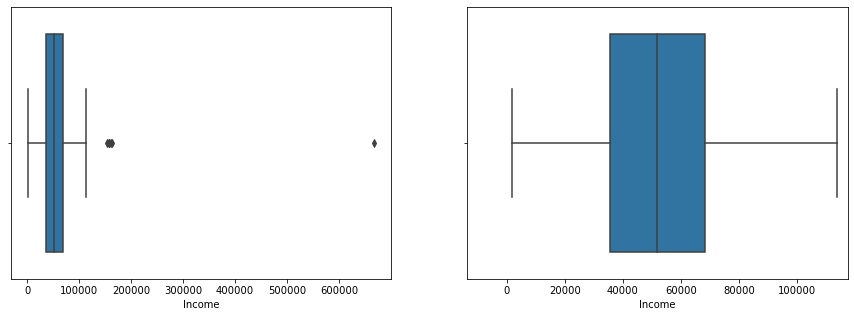

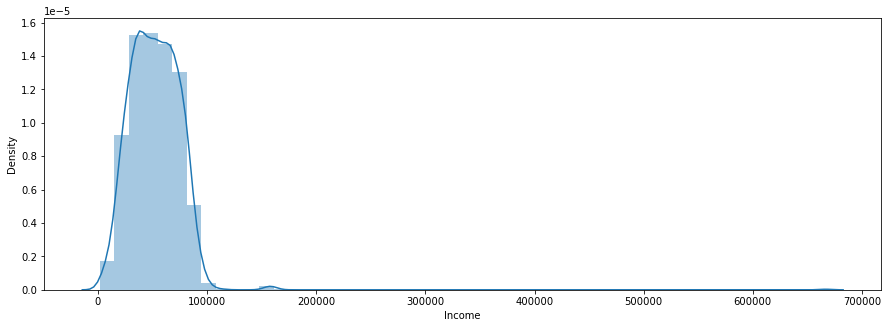

In [21]:
diagrama_caixa(data['Income'])
histograma(data['Income'])

In [22]:
data, linhas_removidas = excluir_outliers(data, 'Income')
print('{} linhas removidas'.format(linhas_removidas))

8 linhas removidas


- Gráfico Income sem outlier

(2232, 24)


C:\Users\ferna.DESKTOP-GFV23K6\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


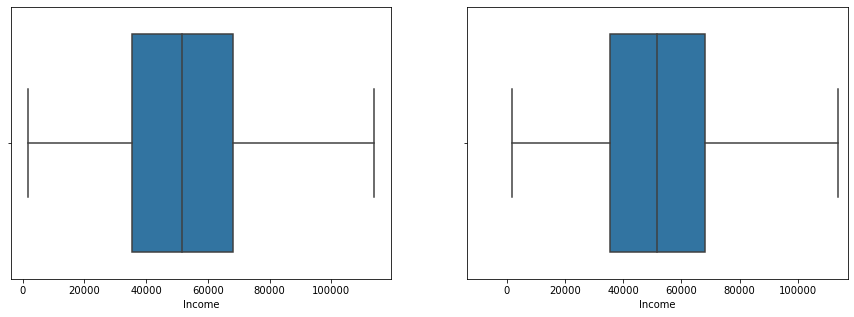

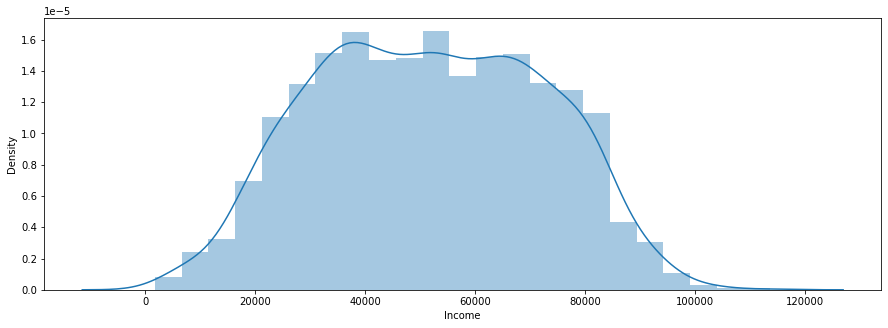

In [23]:
diagrama_caixa(data['Income'])
histograma(data['Income'])
print(data.shape)

In [24]:
def grafico_barra(coluna):
    plt.figure(figsize=(20,10))
    sns.barplot(x=coluna.value_counts().index, y=coluna.value_counts())
   # ax.set_xlim(limites(coluna))

### Removendo outliers da Idade ###

- Gráfico Idade com outlier

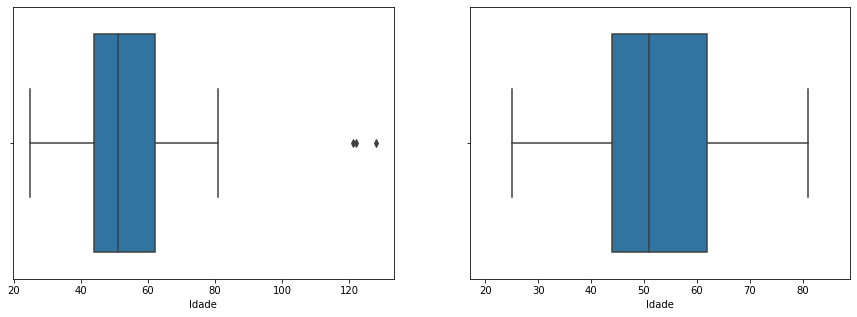

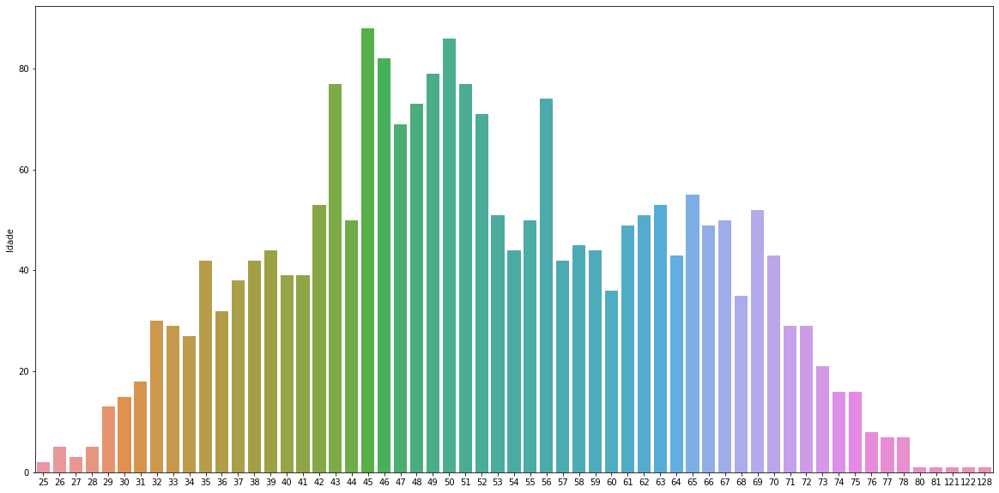

In [25]:
diagrama_caixa(data['Idade'])
grafico_barra(data['Idade'])

- Gráfico Idade sem outlier

3 linhas removidas
(2229, 24)


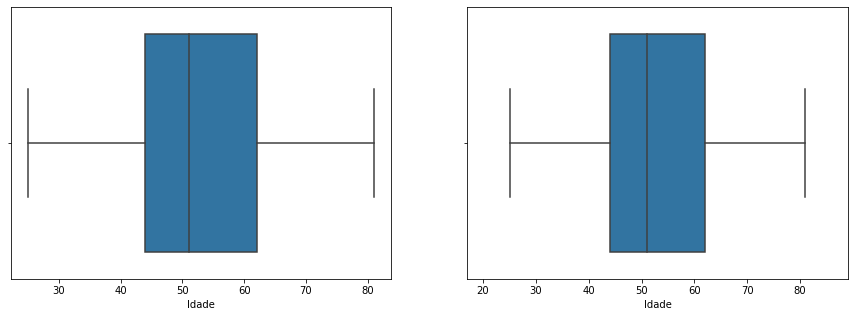

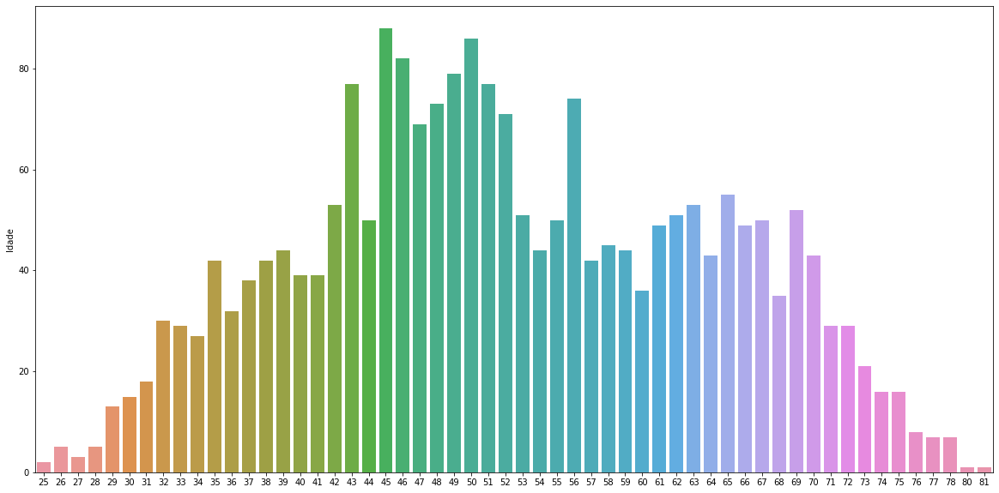

In [26]:
data, linhas_removidas = excluir_outliers(data, 'Idade')
print('{} linhas removidas'.format(linhas_removidas))
diagrama_caixa(data['Idade'])
grafico_barra(data['Idade'])
print(data.shape)

### Removendo outliers do NumWebVisitsMonth ###

- Gráfico de NumWebVisitsMonth com Outlier

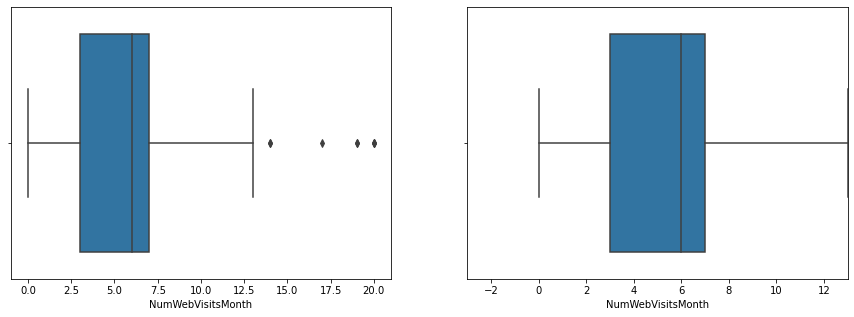

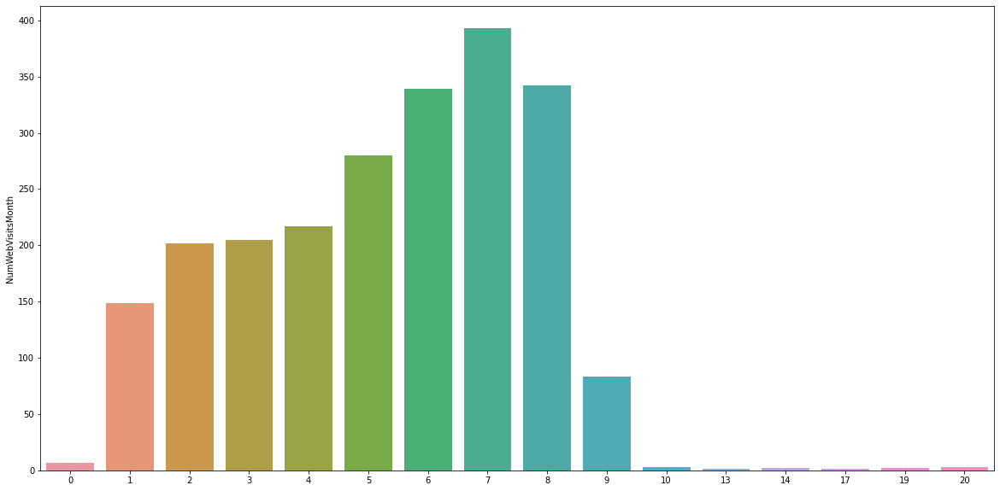

In [27]:
diagrama_caixa(data['NumWebVisitsMonth'])
grafico_barra(data['NumWebVisitsMonth'])

- Gráfico de NumWebVisitsMonth sem Outlier

8 linhas removidas
(2221, 24)


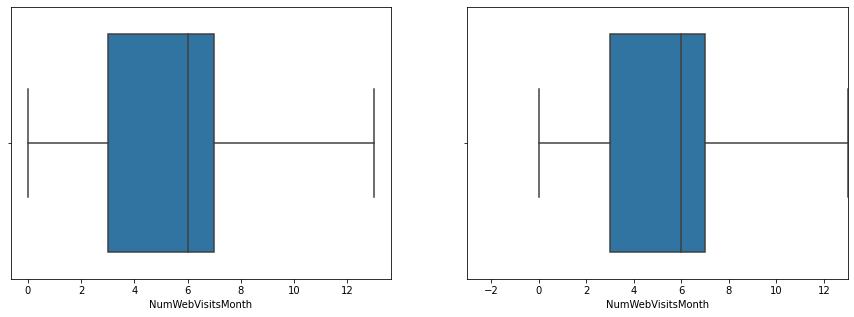

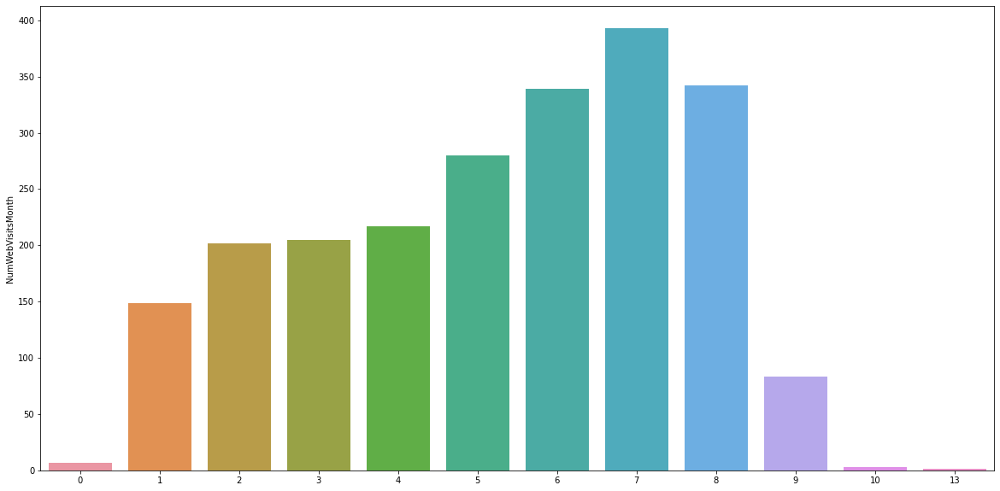

In [28]:
data, linhas_removidas = excluir_outliers(data, 'NumWebVisitsMonth')
print('{} linhas removidas'.format(linhas_removidas))
diagrama_caixa(data['NumWebVisitsMonth'])
grafico_barra(data['NumWebVisitsMonth'])
print(data.shape)

### Removendo outliers do NumWebPurchases ###

- Gráfico de NumWebPurchases com Outlier

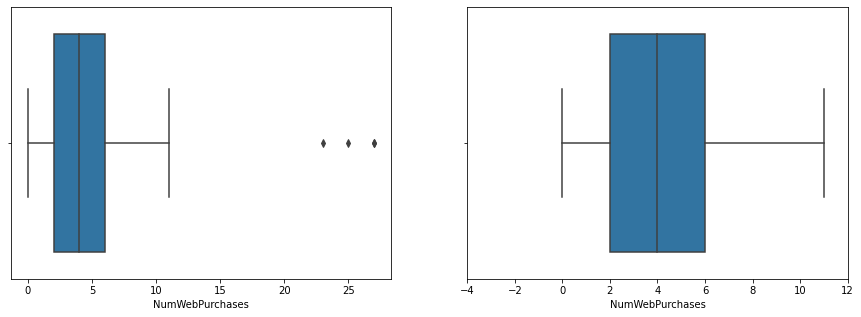

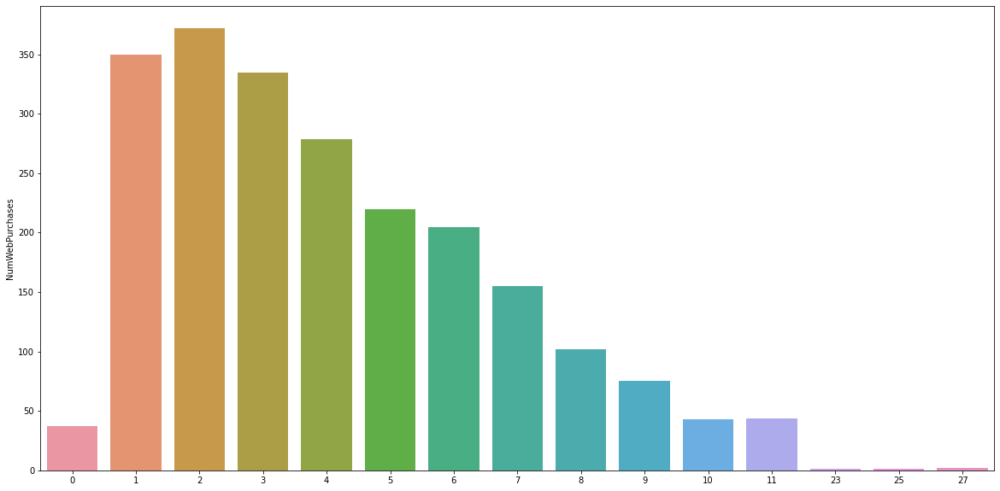

In [29]:
diagrama_caixa(data['NumWebPurchases'])
grafico_barra(data['NumWebPurchases'])

- Gráfico de NumWebPurchases sem Outlier

4 linhas removidas
(2217, 24)


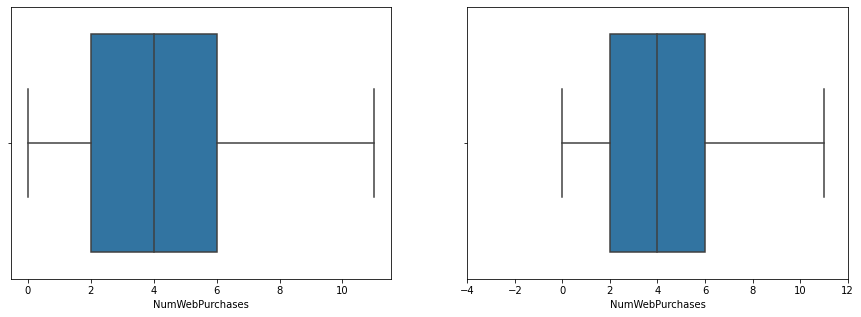

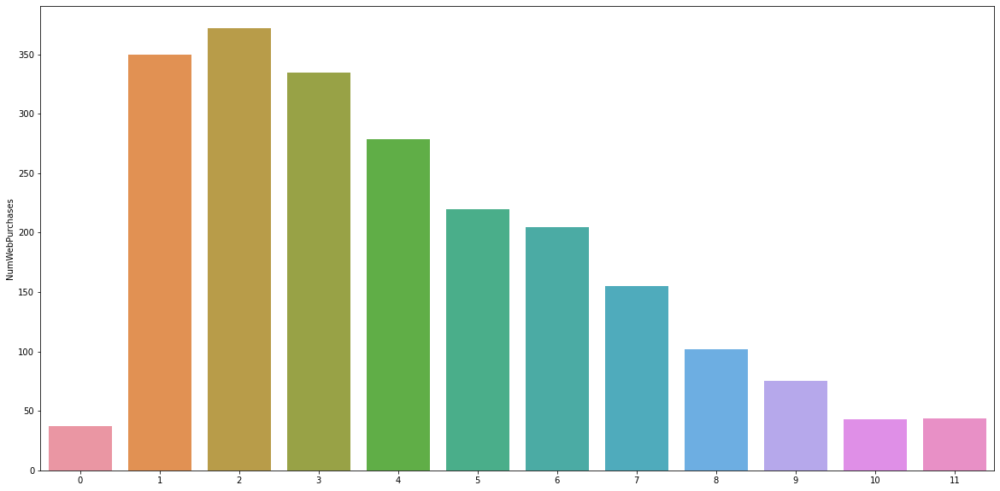

In [30]:
data, linhas_removidas = excluir_outliers(data, 'NumWebPurchases')
print('{} linhas removidas'.format(linhas_removidas))
diagrama_caixa(data['NumWebPurchases'])
grafico_barra(data['NumWebPurchases'])
print(data.shape)

In [31]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2217 entries, 0 to 2239
Data columns (total 24 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Education            2217 non-null   object 
 1   Marital_Status       2217 non-null   object 
 2   Income               2217 non-null   float64
 3   Kidhome              2217 non-null   int64  
 4   Teenhome             2217 non-null   int64  
 5   Recency              2217 non-null   int64  
 6   MntWines             2217 non-null   int64  
 7   MntFruits            2217 non-null   int64  
 8   MntMeatProducts      2217 non-null   int64  
 9   MntFishProducts      2217 non-null   int64  
 10  MntSweetProducts     2217 non-null   int64  
 11  MntGoldProds         2217 non-null   int64  
 12  NumDealsPurchases    2217 non-null   int64  
 13  NumWebPurchases      2217 non-null   int64  
 14  NumCatalogPurchases  2217 non-null   int64  
 15  NumStorePurchases    2217 non-null   i

### Tratamento de colunas de valores de texto ###

- Verificando a coluna Education

Graduation    1118
PhD            476
Master         368
2n Cycle       201
Basic           54
Name: Education, dtype: int64


C:\Users\ferna.DESKTOP-GFV23K6\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Education', ylabel='count'>

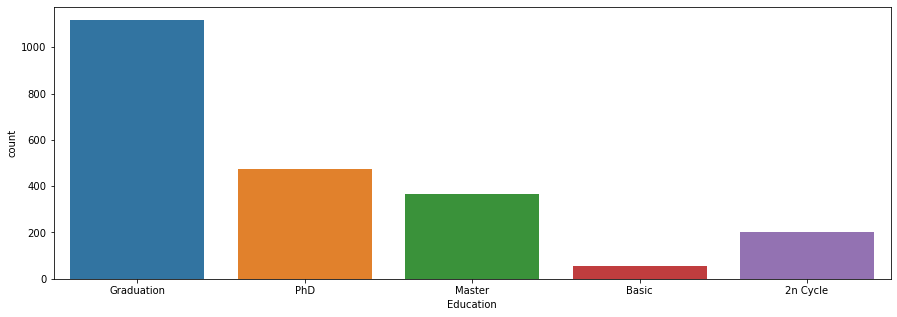

In [32]:
print(data['Education'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('Education', data=data)

In [33]:
tabela_educacao=data['Education'].value_counts()

colunas_agrupar = []

for estado in tabela_educacao.index:
        if tabela_educacao[estado] < 201:
            colunas_agrupar.append(estado)
print(colunas_agrupar)

for estado in colunas_agrupar:
    data.loc[data['Education']==estado, 'Education'] = '2n Cycle'

print(data['Education'].value_counts())

['Basic']
Graduation    1118
PhD            476
Master         368
2n Cycle       255
Name: Education, dtype: int64


C:\Users\ferna.DESKTOP-GFV23K6\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Education', ylabel='count'>

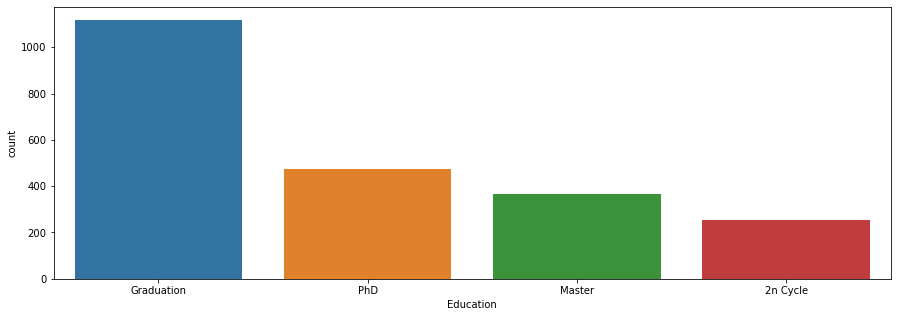

In [34]:
plt.figure(figsize=(15,5))
sns.countplot('Education', data=data)

- Verificando a coluna Marital_Status

Married     859
Together    573
Single      473
Divorced    228
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64


C:\Users\ferna.DESKTOP-GFV23K6\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Marital_Status', ylabel='count'>

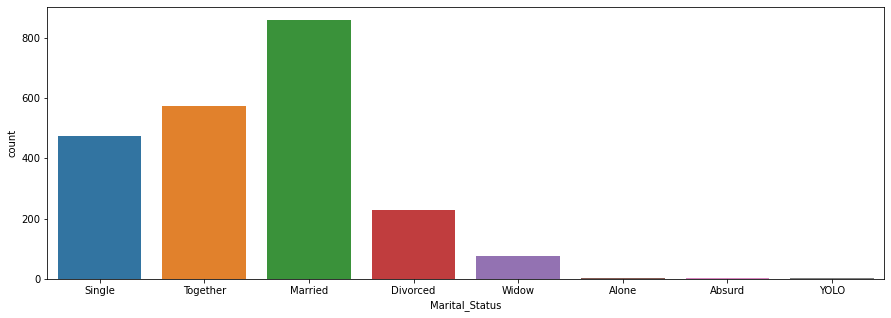

In [35]:
print(data['Marital_Status'].value_counts())
plt.figure(figsize=(15,5))
sns.countplot('Marital_Status', data=data)

- Agrupando as colunas: 'Alone', 'Absurd', 'YOLO' em Single

In [36]:
tabela_estado_civil=data['Marital_Status'].value_counts()

colunas_agrupar = []

for estado in tabela_estado_civil.index:
        if tabela_estado_civil[estado] < 77:
            colunas_agrupar.append(estado)
print(colunas_agrupar)

for estado in colunas_agrupar:
    data.loc[data['Marital_Status']==estado, 'Marital_Status'] = 'Single'

print(data['Marital_Status'].value_counts())

['Alone', 'Absurd', 'YOLO']
Married     859
Together    573
Single      480
Divorced    228
Widow        77
Name: Marital_Status, dtype: int64


C:\Users\ferna.DESKTOP-GFV23K6\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Marital_Status', ylabel='count'>

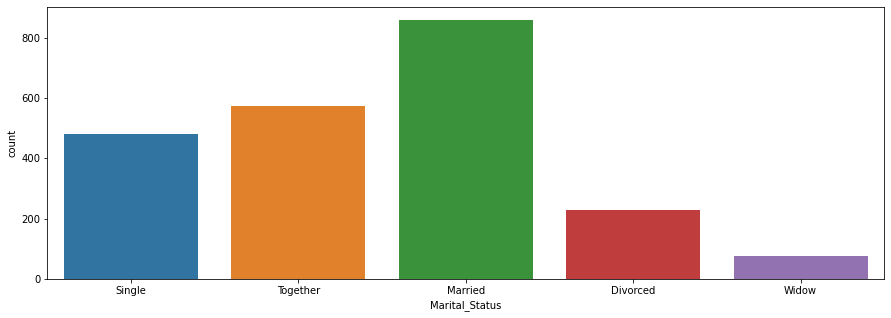

In [37]:
plt.figure(figsize=(15,5))
sns.countplot('Marital_Status', data=data)

### Resumo dos dados até agora ###

- Analisando somente os gráficos de barra temos que:
 1) Um pouco mais da metade dos consumidades tem o Ensino Superior (Graduação);
 2) A maioria dos consumidores estão casados/ morando juntos;
 3) A média da renda anual deles é de $52247.25;
 4) Mais de 50% desses consumidores não tem filhos (crianças e/ou adolescentes);
 5) A média do número de dias desde a última compra é de 49;
 6) O intervalo de idade predominante dos consumidores está entre 40 á 60 anos
 7) A quantidade de vezes predominante dos consumidores que compraram pelo site da empresa está entre 1 á 3 

In [38]:
#pandas_profiling.ProfileReport(data)

In [39]:
data['Income'] = data['Income'].astype(np.int64)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2217 entries, 0 to 2239
Data columns (total 24 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Education            2217 non-null   object
 1   Marital_Status       2217 non-null   object
 2   Income               2217 non-null   int64 
 3   Kidhome              2217 non-null   int64 
 4   Teenhome             2217 non-null   int64 
 5   Recency              2217 non-null   int64 
 6   MntWines             2217 non-null   int64 
 7   MntFruits            2217 non-null   int64 
 8   MntMeatProducts      2217 non-null   int64 
 9   MntFishProducts      2217 non-null   int64 
 10  MntSweetProducts     2217 non-null   int64 
 11  MntGoldProds         2217 non-null   int64 
 12  NumDealsPurchases    2217 non-null   int64 
 13  NumWebPurchases      2217 non-null   int64 
 14  NumCatalogPurchases  2217 non-null   int64 
 15  NumStorePurchases    2217 non-null   int64 
 16  NumWeb

In [40]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

### Transformando as variáveis categóricas (Educação e Estado Civil) para númericas, por meio de valores binários. ###

In [41]:
#labelencoder = LabelEncoder()
#data['Educaçao'] = labelencoder.fit_transform(data['Education'])
#data

In [42]:
data['Education'].value_counts()

Graduation    1118
PhD            476
Master         368
2n Cycle       255
Name: Education, dtype: int64

In [43]:
data["Marital_Status"].value_counts()
data

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Idade
0,Graduation,Single,58138,0,0,58,635,88,546,172,...,10,4,7,0,0,0,0,0,1,64
1,Graduation,Single,46344,1,1,38,11,1,6,2,...,1,2,5,0,0,0,0,0,0,67
2,Graduation,Together,71613,0,0,26,426,49,127,111,...,2,10,4,0,0,0,0,0,0,56
3,Graduation,Together,26646,1,0,26,11,4,20,10,...,0,4,6,0,0,0,0,0,0,37
4,PhD,Married,58293,1,0,94,173,43,118,46,...,3,6,5,0,0,0,0,0,0,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,Graduation,Married,61223,0,1,46,709,43,182,42,...,3,4,5,0,0,0,0,0,0,54
2236,PhD,Together,64014,2,1,56,406,0,30,0,...,2,5,7,0,0,0,1,0,0,75
2237,Graduation,Divorced,56981,0,0,91,908,48,217,32,...,3,13,6,0,1,0,0,0,0,40
2238,Master,Together,69245,0,1,8,428,30,214,80,...,5,10,3,0,0,0,0,0,0,65


In [44]:
#data['Estado Civil'] = labelencoder.fit_transform(data['Marital_Status'])
#data.head(100)

In [45]:
one_hot_encoded_data = pd.get_dummies(data, columns = ['Education', 'Marital_Status'])
one_hot_encoded_data

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,Idade,Education_2n Cycle,Education_Graduation,Education_Master,Education_PhD,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow
0,58138,0,0,58,635,88,546,172,88,88,...,64,0,1,0,0,0,0,1,0,0
1,46344,1,1,38,11,1,6,2,1,6,...,67,0,1,0,0,0,0,1,0,0
2,71613,0,0,26,426,49,127,111,21,42,...,56,0,1,0,0,0,0,0,1,0
3,26646,1,0,26,11,4,20,10,3,5,...,37,0,1,0,0,0,0,0,1,0
4,58293,1,0,94,173,43,118,46,27,15,...,40,0,0,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,61223,0,1,46,709,43,182,42,118,247,...,54,0,1,0,0,0,1,0,0,0
2236,64014,2,1,56,406,0,30,0,0,8,...,75,0,0,0,1,0,0,0,1,0
2237,56981,0,0,91,908,48,217,32,12,24,...,40,0,1,0,0,1,0,0,0,0
2238,69245,0,1,8,428,30,214,80,30,61,...,65,0,0,1,0,0,0,0,1,0


In [46]:
one_hot_encoded_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2217 entries, 0 to 2239
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype
---  ------                   --------------  -----
 0   Income                   2217 non-null   int64
 1   Kidhome                  2217 non-null   int64
 2   Teenhome                 2217 non-null   int64
 3   Recency                  2217 non-null   int64
 4   MntWines                 2217 non-null   int64
 5   MntFruits                2217 non-null   int64
 6   MntMeatProducts          2217 non-null   int64
 7   MntFishProducts          2217 non-null   int64
 8   MntSweetProducts         2217 non-null   int64
 9   MntGoldProds             2217 non-null   int64
 10  NumDealsPurchases        2217 non-null   int64
 11  NumWebPurchases          2217 non-null   int64
 12  NumCatalogPurchases      2217 non-null   int64
 13  NumStorePurchases        2217 non-null   int64
 14  NumWebVisitsMonth        2217 non-null   int64
 15  Acce

In [47]:
one_hot_encoded_data['Education_2n Cycle'] = one_hot_encoded_data['Education_2n Cycle'].astype(np.int64)
one_hot_encoded_data['Education_Graduation'] = one_hot_encoded_data['Education_Graduation'].astype(np.int64)
one_hot_encoded_data['Education_Master'] = one_hot_encoded_data['Education_Master'].astype(np.int64)
one_hot_encoded_data['Education_PhD'] = one_hot_encoded_data['Education_PhD'].astype(np.int64)
one_hot_encoded_data['Marital_Status_Divorced'] = one_hot_encoded_data['Marital_Status_Divorced'].astype(np.int64)
one_hot_encoded_data['Marital_Status_Married'] = one_hot_encoded_data['Marital_Status_Married'].astype(np.int64)
one_hot_encoded_data['Marital_Status_Single'] = one_hot_encoded_data['Marital_Status_Single'].astype(np.int64)
one_hot_encoded_data['Marital_Status_Widow'] = one_hot_encoded_data['Marital_Status_Widow'].astype(np.int64)
one_hot_encoded_data['Marital_Status_Together'] = one_hot_encoded_data['Marital_Status_Together'].astype(np.int64)
one_hot_encoded_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2217 entries, 0 to 2239
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype
---  ------                   --------------  -----
 0   Income                   2217 non-null   int64
 1   Kidhome                  2217 non-null   int64
 2   Teenhome                 2217 non-null   int64
 3   Recency                  2217 non-null   int64
 4   MntWines                 2217 non-null   int64
 5   MntFruits                2217 non-null   int64
 6   MntMeatProducts          2217 non-null   int64
 7   MntFishProducts          2217 non-null   int64
 8   MntSweetProducts         2217 non-null   int64
 9   MntGoldProds             2217 non-null   int64
 10  NumDealsPurchases        2217 non-null   int64
 11  NumWebPurchases          2217 non-null   int64
 12  NumCatalogPurchases      2217 non-null   int64
 13  NumStorePurchases        2217 non-null   int64
 14  NumWebVisitsMonth        2217 non-null   int64
 15  Acce

### Modelo de Previsão e Classificação em funçáo da Renda para obtermos maiores lucros ###

- Métricas de avaliação


In [48]:
def avaliar_modelo(nome_modelo, y_teste, previsao):
        r2 = r2_score(y_teste, previsao)
        RSME = np.sqrt(mean_squared_error(y_teste, previsao))
        return f'Modelo {nome_modelo}:nR²:{r2:.2%}\nRSME:{RSME:.2f}'

- Escolha dos modelos a serem testados:

        1.Random Forest
        2.Extra Tree
        3.Regressão Logística
        4.Regressão Linear
        5. svm

In [49]:
modelo_rf = RandomForestRegressor()
modelo_lr = LogisticRegression()
modelo_lir = LinearRegression()
modelo_et = ExtraTreesRegressor()
modelo_svm = svm.SVC()

modelos = {'RandomForest': modelo_rf,
           'LogisticRegression': modelo_lr,
           'LineaarRegression': modelo_lir,
          'ExtraTrees': modelo_et,
           'SVM': modelo_svm,
          }
y=one_hot_encoded_data['Income']
X=one_hot_encoded_data.drop('Income',axis=1)

In [50]:
import warnings

In [51]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1000)

for nome_modelo, modelo in modelos.items():
    #treinar
    modelo.fit(X_train, y_train)
    #testar
    previsao = modelo.predict(X_test)
    print(avaliar_modelo(nome_modelo, y_test, previsao))

Modelo RandomForest:nR²:88.74%
RSME:6927.93


C:\Users\ferna.DESKTOP-GFV23K6\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Modelo LogisticRegression:nR²:62.69%
RSME:12609.24
Modelo LineaarRegression:nR²:82.09%
RSME:8735.81
Modelo ExtraTrees:nR²:89.78%
RSME:6600.12
Modelo SVM:nR²:10.83%
RSME:19492.59


### Análise do melhor modelo ###

In [52]:
for nome_modelo, modelo in modelos.items():
    #testar
    previsao = modelo.predict(X_test)
    print(avaliar_modelo(nome_modelo, y_test, previsao))

Modelo RandomForest:nR²:88.74%
RSME:6927.93
Modelo LogisticRegression:nR²:62.69%
RSME:12609.24
Modelo LineaarRegression:nR²:82.09%
RSME:8735.81
Modelo ExtraTrees:nR²:89.78%
RSME:6600.12
Modelo SVM:nR²:10.83%
RSME:19492.59


- Modelo escolhido ExtraTrees, pois tem maior R² e menor tempo de RSME 

### Ajustes e melhorias no modelo ###

In [53]:
print(modelo_et.feature_importances_)

[0.01655165 0.0360129  0.00703042 0.2725434  0.0210457  0.13137966
 0.03876303 0.03562873 0.00628889 0.02895949 0.01796562 0.07605357
 0.15436653 0.0760087  0.00208766 0.00220792 0.02959235 0.00299232
 0.00064689 0.00269434 0.00850234 0.00350474 0.00390823 0.00344086
 0.00502131 0.00333486 0.00375865 0.00461858 0.00309447 0.0019962 ]


In [54]:
print(X_test.columns)

Index(['Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Response', 'Idade', 'Education_2n Cycle',
       'Education_Graduation', 'Education_Master', 'Education_PhD',
       'Marital_Status_Divorced', 'Marital_Status_Married',
       'Marital_Status_Single', 'Marital_Status_Together',
       'Marital_Status_Widow'],
      dtype='object')


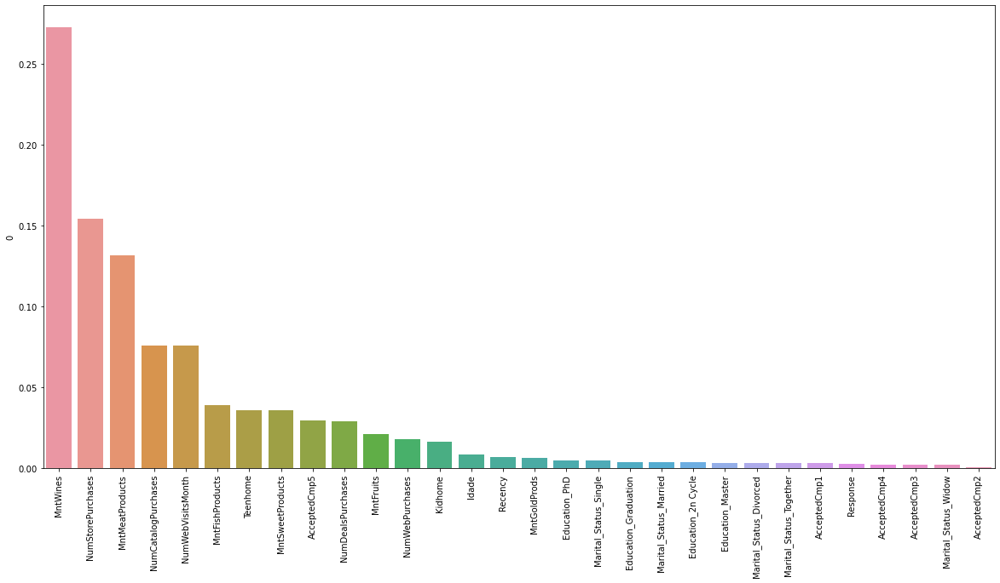

In [55]:
importancia_features = pd.DataFrame(modelo_et.feature_importances_, X_test.columns)
importancia_features = importancia_features.sort_values(by = 0, ascending=False)
#display(importancia_features)
plt.figure(figsize=(20,10))
ax = sns.barplot(x=importancia_features.index, y=importancia_features[0])
ax.tick_params(axis='x', rotation=90)

- A Variável AcceptedCmp2 tem pouca ou nenhuma releväncia quando comparado com a Renda

In [56]:
base_ifood_cod = one_hot_encoded_data.drop(['AcceptedCmp2'], axis=1)

y=base_ifood_cod['Income']
X=base_ifood_cod.drop('Income',axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1000)

modelo_et.fit(X_train, y_train)
previsao = modelo_et.predict(X_test)
print(avaliar_modelo('ExtraTrees', y_test, previsao))

Modelo ExtraTrees:nR²:89.85%
RSME:6575.13


- Com a remoção da variável AcceptedCmp2 o R² aumentou em quase 1%

### Agrupamento de classes e novo teste do modelo ###

In [57]:
from sklearn.cluster import KMeans

In [58]:
base_ifood_cod.dtypes

Income                     int64
Kidhome                    int64
Teenhome                   int64
Recency                    int64
MntWines                   int64
MntFruits                  int64
MntMeatProducts            int64
MntFishProducts            int64
MntSweetProducts           int64
MntGoldProds               int64
NumDealsPurchases          int64
NumWebPurchases            int64
NumCatalogPurchases        int64
NumStorePurchases          int64
NumWebVisitsMonth          int64
AcceptedCmp3               int64
AcceptedCmp4               int64
AcceptedCmp5               int64
AcceptedCmp1               int64
Response                   int64
Idade                      int64
Education_2n Cycle         int64
Education_Graduation       int64
Education_Master           int64
Education_PhD              int64
Marital_Status_Divorced    int64
Marital_Status_Married     int64
Marital_Status_Single      int64
Marital_Status_Together    int64
Marital_Status_Widow       int64
dtype: obj

In [59]:
base_ifood_cod.describe()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,Idade,Education_2n Cycle,Education_Graduation,Education_Master,Education_PhD,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow
count,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,...,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000
mean,51809.610735,0.445196,0.507442,49.147497,306.465043,26.470907,166.103293,37.833559,27.059991,43.778981,...,52.107352,0.115020,0.504285,0.165990,0.214705,0.102842,0.387461,0.216509,0.258457,0.034732
std,20377.133897,0.538915,0.544138,28.932970,337.063720,39.834882,219.641611,54.786349,40.809228,50.922818,...,11.698615,0.319118,0.500094,0.372156,0.410710,0.303821,0.487280,0.411958,0.437885,0.183141
min,2447.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,35688.000000,0.000000,0.000000,24.000000,24.000000,2.000000,16.000000,3.000000,1.000000,9.000000,...,44.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,51717.000000,0.000000,0.000000,49.000000,179.000000,8.000000,68.000000,12.000000,8.000000,25.000000,...,51.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,68126.000000,1.000000,1.000000,74.000000,507.000000,33.000000,232.000000,50.000000,34.000000,56.000000,...,62.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000
max,105471.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,198.000000,249.000000,...,81.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### normalizando os dados para obter o knn mais preciso ###

In [60]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_scaled = scaler.fit_transform(base_ifood_cod)
# statisticas do dataset padronizado
pd.DataFrame(df_scaled).describe()

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
count,2.217000e+03,2.217000e+03,2.217000e+03,2.217000e+03,2.217000e+03,2.217000e+03,2.217000e+03,2.217000e+03,2.217000e+03,2.217000e+03,...,2.217000e+03,2.217000e+03,2.217000e+03,2.217000e+03,2.217000e+03,2.217000e+03,2.217000e+03,2.217000e+03,2.217000e+03,2.217000e+03
mean,9.841524e-17,8.413057e-17,-6.871665e-16,2.123295e-17,-1.061648e-17,-5.478502e-17,4.669747e-17,2.153342e-17,-3.545502e-17,-7.136075e-18,...,4.356762e-17,-2.968106e-16,-2.321603e-16,3.221249e-16,-7.701953e-17,3.034710e-16,-1.582456e-17,1.765740e-16,-2.483855e-16,-2.564230e-16
std,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,...,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00,1.000226e+00
min,-2.422998e+00,-8.262837e-01,-9.327723e-01,-1.699051e+00,-9.094250e-01,-6.646657e-01,-7.564175e-01,-6.907212e-01,-6.632347e-01,-8.599064e-01,...,-2.317665e+00,-3.605127e-01,-1.008607e+00,-4.461239e-01,-5.228825e-01,-3.385712e-01,-7.953288e-01,-5.256791e-01,-5.903729e-01,-1.896874e-01
25%,-7.913403e-01,-8.262837e-01,-9.327723e-01,-8.693601e-01,-8.382058e-01,-6.144471e-01,-6.835552e-01,-6.359507e-01,-6.387249e-01,-6.831285e-01,...,-6.931745e-01,-3.605127e-01,-1.008607e+00,-4.461239e-01,-5.228825e-01,-3.385712e-01,-7.953288e-01,-5.256791e-01,-5.903729e-01,-1.896874e-01
50%,-4.545862e-03,-8.262837e-01,-9.327723e-01,-5.099023e-03,-3.782484e-01,-4.637913e-01,-4.467524e-01,-4.716392e-01,-4.671564e-01,-3.688566e-01,...,-9.467805e-02,-3.605127e-01,9.914663e-01,-4.461239e-01,-5.228825e-01,-3.385712e-01,-7.953288e-01,-5.256791e-01,-5.903729e-01,-1.896874e-01
75%,8.009012e-01,1.029715e+00,9.054110e-01,8.591621e-01,5.950810e-01,1.639409e-01,3.000869e-01,2.221208e-01,1.700982e-01,2.400452e-01,...,8.458163e-01,-3.605127e-01,9.914663e-01,-4.461239e-01,-5.228825e-01,-3.385712e-01,1.257342e+00,-5.256791e-01,1.693845e+00,-1.896874e-01
max,2.634006e+00,2.885714e+00,2.743594e+00,1.723423e+00,3.521004e+00,4.332083e+00,7.099057e+00,4.037800e+00,4.189704e+00,4.030950e+00,...,2.470307e+00,2.773827e+00,9.914663e-01,2.241530e+00,1.912476e+00,2.953588e+00,1.257342e+00,1.902301e+00,1.693845e+00,5.271832e+00


In [61]:
# Instanciando o KMeans com o modo 'k-means++'
kmeans = KMeans(n_clusters=4, init='k-means++')
# fittando o k means nos dados padronizados
kmeans.fit(df_scaled)
# inertia on the fitted data
kmeans.inertia_

48221.50706441494

Text(0, 0.5, 'Inertia')

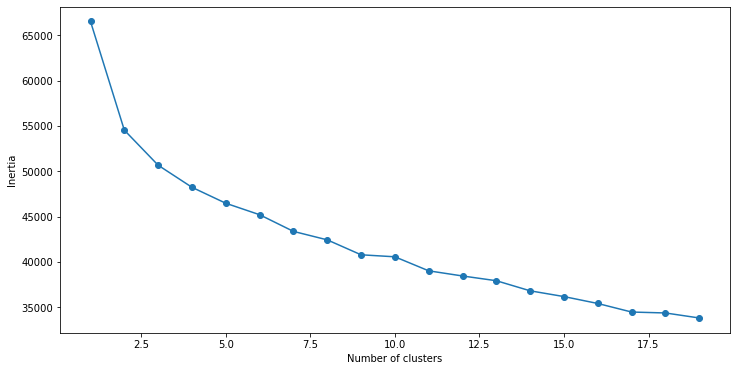

In [62]:
# fittando vários modelos e armazenando a inércia em uma lista
SSE = []
for cluster in range(1,20):
    kmeans = KMeans(n_clusters = cluster, init='k-means++')
    kmeans.fit(df_scaled)
    SSE.append(kmeans.inertia_)
# convertendo os resultados em um dataframe e plotando
frame = pd.DataFrame({'Cluster':range(1,20), 'SSE':SSE})
plt.figure(figsize=(12,6))
plt.plot(frame['Cluster'], frame['SSE'], marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

In [63]:
# vamos reinstanciar o nosso modelo, agora com 6 clusters 
kmeans = KMeans(n_clusters = 6, init='k-means++')
kmeans.fit(df_scaled)
pred = kmeans.predict(df_scaled)
# criamos um novo dataframe com os dados do df original 
# adicionamos a etiqueta dos clusters
df_final = pd.DataFrame(base_ifood_cod)
df_final['cluster'] = pred
df_final['cluster'].value_counts()

3    815
4    565
0    419
5    173
2    170
1     75
Name: cluster, dtype: int64

In [64]:
df_final[df_final['cluster']==0]

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,Education_2n Cycle,Education_Graduation,Education_Master,Education_PhD,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,cluster
0,58138,0,0,58,635,88,546,172,88,88,...,0,1,0,0,0,0,1,0,0,0
2,71613,0,0,26,426,49,127,111,21,42,...,0,1,0,0,0,0,0,1,0,0
12,63033,0,0,82,194,61,480,225,112,30,...,0,1,0,0,1,0,0,0,0,0
21,2447,1,0,42,1,1,1725,1,1,1,...,0,1,0,0,0,1,0,0,0,0
34,68657,0,0,4,482,34,471,119,68,22,...,0,0,1,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2203,73807,0,1,88,366,124,156,71,78,54,...,0,1,0,0,0,1,0,0,0,0
2206,61014,0,1,17,269,129,495,182,43,29,...,0,1,0,0,0,1,0,0,0,0
2211,88325,0,0,42,519,71,860,93,27,53,...,0,1,0,0,0,0,0,1,0,0
2213,80617,0,0,42,594,51,631,72,55,32,...,1,0,0,0,0,0,1,0,0,0


In [65]:
df_final.describe()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,Education_2n Cycle,Education_Graduation,Education_Master,Education_PhD,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Together,Marital_Status_Widow,cluster
count,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,...,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000,2217.000000
mean,51809.610735,0.445196,0.507442,49.147497,306.465043,26.470907,166.103293,37.833559,27.059991,43.778981,...,0.115020,0.504285,0.165990,0.214705,0.102842,0.387461,0.216509,0.258457,0.034732,2.699594
std,20377.133897,0.538915,0.544138,28.932970,337.063720,39.834882,219.641611,54.786349,40.809228,50.922818,...,0.319118,0.500094,0.372156,0.410710,0.303821,0.487280,0.411958,0.437885,0.183141,1.546209
min,2447.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,35688.000000,0.000000,0.000000,24.000000,24.000000,2.000000,16.000000,3.000000,1.000000,9.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,51717.000000,0.000000,0.000000,49.000000,179.000000,8.000000,68.000000,12.000000,8.000000,25.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
75%,68126.000000,1.000000,1.000000,74.000000,507.000000,33.000000,232.000000,50.000000,34.000000,56.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,4.000000
max,105471.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,198.000000,249.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000


In [66]:
df_final.dtypes

Income                     int64
Kidhome                    int64
Teenhome                   int64
Recency                    int64
MntWines                   int64
MntFruits                  int64
MntMeatProducts            int64
MntFishProducts            int64
MntSweetProducts           int64
MntGoldProds               int64
NumDealsPurchases          int64
NumWebPurchases            int64
NumCatalogPurchases        int64
NumStorePurchases          int64
NumWebVisitsMonth          int64
AcceptedCmp3               int64
AcceptedCmp4               int64
AcceptedCmp5               int64
AcceptedCmp1               int64
Response                   int64
Idade                      int64
Education_2n Cycle         int64
Education_Graduation       int64
Education_Master           int64
Education_PhD              int64
Marital_Status_Divorced    int64
Marital_Status_Married     int64
Marital_Status_Single      int64
Marital_Status_Together    int64
Marital_Status_Widow       int64
cluster   

In [67]:
df_final['cluster'] = df_final['cluster'].astype(np.int64)

In [72]:
y=df_final['cluster']
X=df_final.drop('cluster',axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1000)

modelo_et.fit(X_train, y_train)
previsao = modelo_et.predict(X_test)
print(avaliar_modelo('ExtraTrees', y_test, previsao))

Modelo ExtraTrees:nR²:89.44%
RSME:0.50


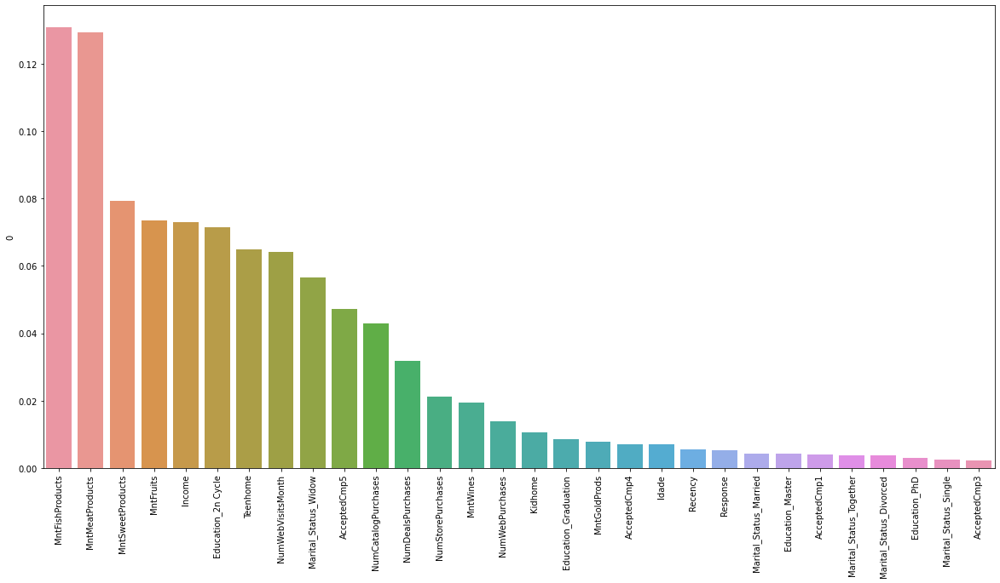

In [69]:
importancia_features = pd.DataFrame(modelo_et.feature_importances_, X_test.columns)
importancia_features = importancia_features.sort_values(by = 0, ascending=False)
#display(importancia_features)
plt.figure(figsize=(20,10))
ax = sns.barplot(x=importancia_features.index, y=importancia_features[0])
ax.tick_params(axis='x', rotation=90)


In [70]:
pandas_profiling.ProfileReport(df_final)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]